<a href="https://colab.research.google.com/github/albivaltzew/container_number_rec/blob/main/Diploma_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Start

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from sklearn.model_selection import train_test_split
import shutil
import os
from matplotlib import pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
import time

In [3]:
!pip install ultralytics
from ultralytics import YOLO

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.0/612.0 kB 27.6 MB/s eta 0:00:00


In [4]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!unzip -q  /content/drive/MyDrive/Container_Dataset/train_images.zip -d /content/data
!unzip -q /content/drive/MyDrive/Container_Dataset/images_label_yolo.zip -d /content/data
!unzip -q /content/drive/MyDrive/Container_Dataset/test_images.zip -d /content/data

mmOCR

In [5]:
!pip install -U openmim
!mim install mmengine
!mim install 'mmcv>=2.0.0rc1'
!mim install 'mmdet>=3.0.0rc0'
!git clone https://github.com/open-mmlab/mmocr.git
%cd mmocr
!pip install -v -e .

from mmocr.apis import MMOCRInferencer
import mmcv

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.3/51.3 kB 5.6 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.3/374.3 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 27.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.4/74.4 MB 10.7 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.openmmlab.com/mmcv/dist/cu118/torch2.0.0/index.html
     ━━━━━━━━━━━━━━━

# Container_dataset

In [6]:
images_path = "/content/data/images"
labels_path = "/content/data/images_label_yolo"

# Read images and annotations
images = [os.path.join(images_path, x) for x in os.listdir(images_path)]
labels = [os.path.join(labels_path, x) for x in os.listdir(labels_path)]

images.sort()
labels.sort()

# Split the dataset into train-valid-test splits
train_images, val_images, train_labels, val_labels = train_test_split(images, labels, test_size = 0.2, random_state = 1)
val_images, test_images, val_labels, test_labels = train_test_split(val_images, val_labels, test_size = 0.5, random_state = 1)

!mkdir /content/data/train /content/data/test /content/data/val


!mkdir /content/data/train/images /content/data/train/labels

!mkdir /content/data/test/images /content/data/test/labels

!mkdir /content/data/val/images /content/data/val/labels

#Utility function to move images
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

train_folder = "/content/data/train"
test_folder = "/content/data/test"
val_folder = "/content/data/val"

# Move the splits into their folders
move_files_to_folder(train_images, train_folder+'/images')
move_files_to_folder(train_labels, train_folder+'/labels')

move_files_to_folder(val_images, val_folder+'/images')
move_files_to_folder(val_labels, val_folder+'/labels')

move_files_to_folder(test_images, test_folder+'/images')
move_files_to_folder(test_labels, test_folder+'/labels')

Inference

In [7]:
model = YOLO('/content/drive/MyDrive/Container_Dataset/best_1_96_epochs.pt')


0: 384x640 2 Container Numbers, 212.7ms
Speed: 26.9ms preprocess, 212.7ms inference, 27.0ms postprocess per image at shape (1, 3, 384, 640)


It took 17862.475872039795 ms


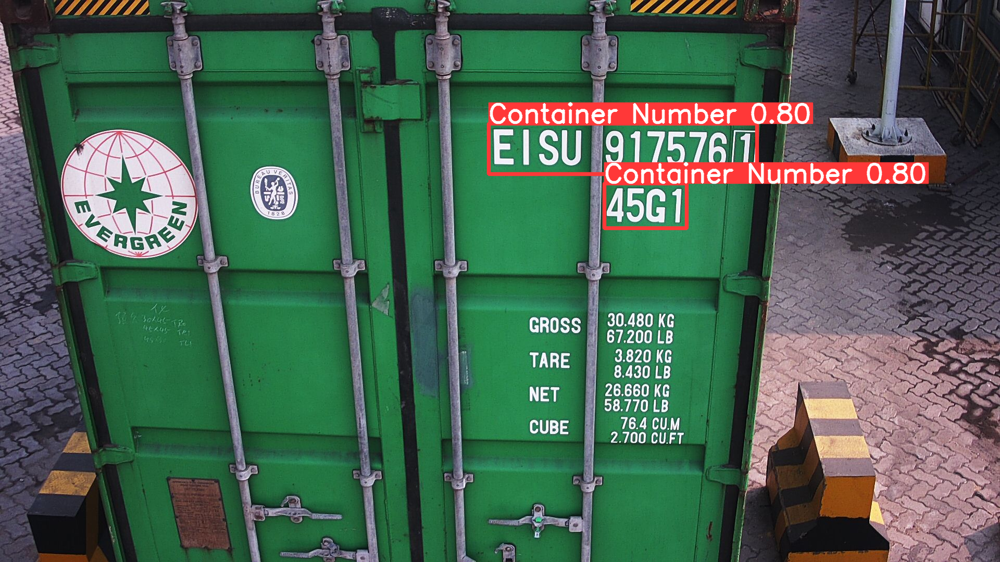

In [8]:
img = "/content/data/test/images/1-130238001-OCR-AS-B01.jpg"
img = cv2.imread(img)
start = time.time()
res = model(img)
print('It took', (time.time()-start)*1000, 'ms')

res_plotted = res[0].plot()
cv2_imshow(res_plotted)

In [9]:
boxes = res[0].boxes
box = boxes  # returns one box
box.xyxy
#Перевод из тензоров с гпу на цпу в целочисленный нампай массив
np_box = box.xyxy[1].detach().cpu().numpy().astype(int)
np_box

array([ 938,  237, 1453,  334])

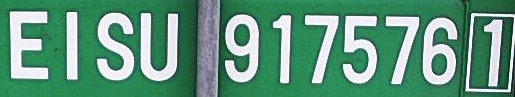

In [10]:
plate = img[np_box[1]: np_box[3], np_box[0]:np_box[2]]
cv2_imshow(plate)

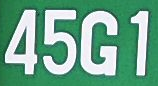

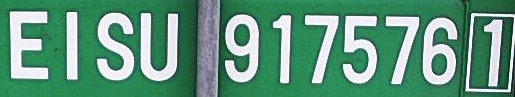

In [11]:
boxes = res[0].boxes
np_boxes = boxes.xyxy.detach().cpu().numpy().astype(int)
for np_box in np_boxes:
  plate = img[np_box[1]: np_box[3], np_box[0]:np_box[2]]
  cv2_imshow(plate)

True

In [12]:
infer = MMOCRInferencer(rec='svtr-small')
model = YOLO('/content/drive/MyDrive/Container_Dataset/best_1_96_epochs.pt')

Loads checkpoint by http backend from path: https://download.openmmlab.com/mmocr/textrecog/svtr/svtr-small_20e_st_mj/svtr-small_20e_st_mj-35d800d6.pth


Downloading: "https://download.openmmlab.com/mmocr/textrecog/svtr/svtr-small_20e_st_mj/svtr-small_20e_st_mj-35d800d6.pth" to /root/.cache/torch/hub/checkpoints/svtr-small_20e_st_mj-35d800d6.pth


06/25 16:43:26 - mmengine - WARNING - Failed to search registry with scope "mmocr" in the "function" registry tree. As a workaround, the current "function" registry in "mmengine" is used to build instance. This may cause unexpected failure when running the built modules. Please check whether "mmocr" is a correct scope, or whether the registry is initialized.
06/25 16:43:26 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


In [13]:
img = "/content/data/test/images/1-130238001-OCR-AS-B01.jpg"
results = []
img = cv2.imread(img)
start = time.time()
res = model(img)
print('Detection time:', (time.time()-start)*1000, 'ms')
boxes = res[0].boxes
np_boxes = boxes.xyxy.detach().cpu().numpy().astype(int)
for np_box in np_boxes:
  plate = img[np_box[1]: np_box[3], np_box[0]:np_box[2]]
  # result = infer(plate, save_vis=True, return_vis=True)
  result = infer(plate)
  results.append(result)
  print(result['predictions'])
print('Recognition time:', (time.time()-start)*1000, 'ms')


0: 384x640 2 Container Numbers, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


Output()

Detection time: 123.52347373962402 ms


Output()

[{'rec_texts': ['45g1'], 'rec_scores': [0.9999061524868011]}]


[{'rec_texts': ['eisu<UKN>9175761<UKN>'], 'rec_scores': [0.8271341919898987]}]
Recognition time: 389.97769355773926 ms


45G1
Код должен содержать 11 знаков
Номер контейнера невалиден.
EISU9175761
Номер контейнера валиден.


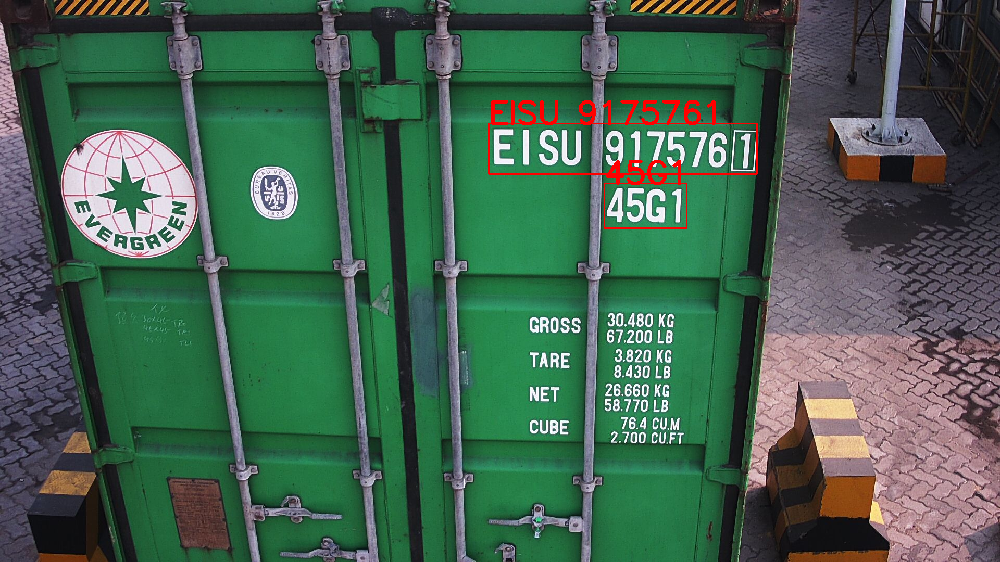

In [42]:
img = "/content/data/test/images/1-130238001-OCR-AS-B01.jpg"
img = cv2.imread(img)
i = 0
for np_box in np_boxes:
  # represents the top left corner of rectangle
  start_point = (np_box[0], np_box[1])

  # represents the bottom right corner of rectangle
  end_point = (np_box[2], np_box[3])

  # Blue color in BGR
  color = (0, 0, 255)

  # Line thickness of 2 px
  thickness = 2
  font_scale = 2
  text = results[i]['predictions'][0]['rec_texts'][0].replace('<UKN>',' ').upper()
  # Using cv2.rectangle() method
  # Draw a rectangle with blue line borders of thickness of 2 px
  cv2.rectangle(img, start_point, end_point, color, thickness)
  img = cv2.putText(img, text, start_point , cv2.FONT_HERSHEY_SIMPLEX, font_scale, color, 5)
  i+=1

  is_valid = calculate_container_checksum(text)
  if is_valid:
    print("Номер контейнера валиден.")
  else:
    print("Номер контейнера невалиден.")

cv2_imshow(img)

# Контрольная сумма

In [39]:
def calculate_container_checksum(container_number):
    # Удаление пробелов и приведение к верхнему регистру
    container_number = container_number.replace(" ", "").upper()
    print(container_number)

    # Проверка наличия 11 символов
    if len(container_number) != 11:
        print('Код должен содержать 11 знаков')
        return False


    alphabet_values = {
        'A': 10, 'B': 12, 'C': 13, 'D': 14, 'E': 15, 'F': 16,
        'G': 17, 'H': 18, 'I': 19, 'J': 20, 'K': 21, 'L': 23,
        'M': 24, 'N': 25, 'O': 26, 'P': 27, 'Q': 28, 'R': 29,
        'S': 30, 'T': 31, 'U': 32, 'V': 34, 'W': 35, 'X': 36,
        'Y': 37, 'Z': 38
    }


    # Вычисление контрольной суммы
    weights = [1, 2, 4, 8, 16, 32, 64, 128, 256, 512]
    total_sum = 0

    for i in range(10):
        char = container_number[i]
        if char.isdigit():
            value = int(char)
        elif char.isalpha() and char in alphabet_values:
            value = alphabet_values[char]
        else:
            return False  # Недопустимый символ

        weighted_value = value * weights[i]
        total_sum += weighted_value


    checksum = int(total_sum / 11)*11
    last_digit = int(container_number[-1])

    checksum = total_sum - checksum

    if checksum == last_digit:
        return True
    else:
        return False

# Пример использования
# container = input("Введите номер морского контейнера: ")
container = "eisu9175761"
# container = 'ECMU 988127 7'
is_valid = calculate_container_checksum(container)
if is_valid:
    print("Номер контейнера валиден.")
else:
    print("Номер контейнера невалиден.")

EISU9175761
Номер контейнера валиден.


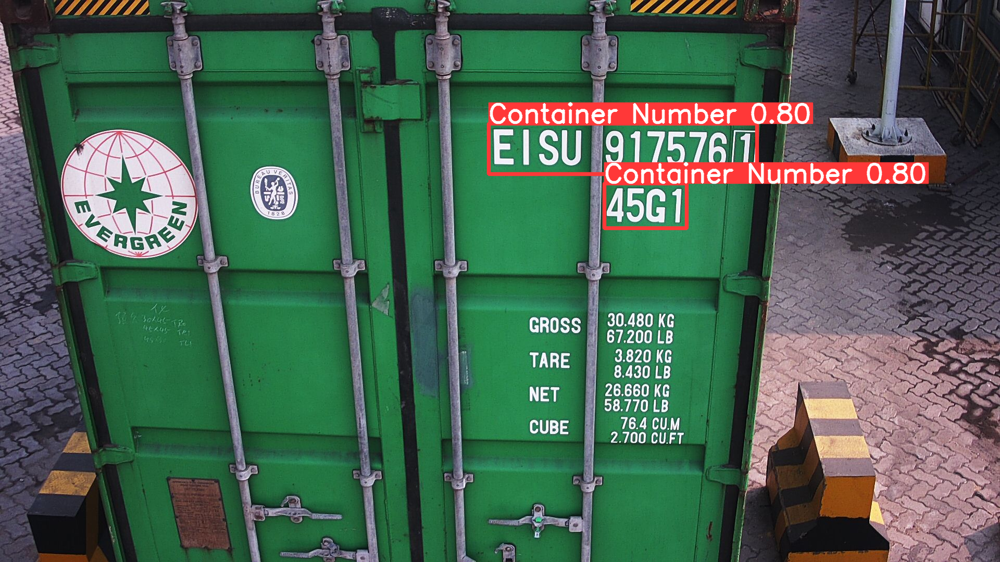

In [18]:
res_plotted = res[0].plot()
cv2_imshow(res_plotted)

# Графики

In [1]:
import matplotlib.pyplot as plt
import json


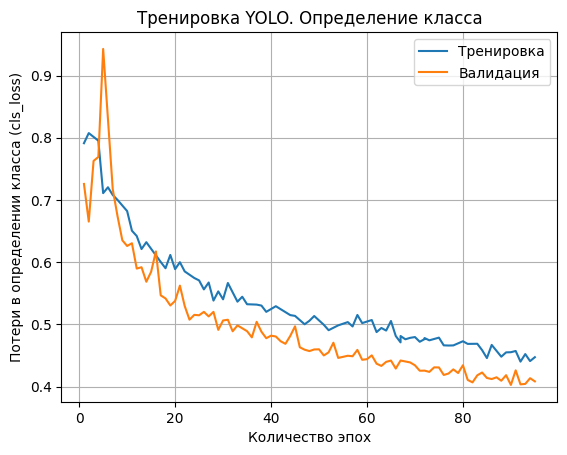

In [19]:
# Указываем путь к JSON-файлу
file_path = '/content/val_cls_loss_chart_data.json'

# Открываем файл и загружаем данные JSON
with open(file_path, 'r') as file:
    data_val_class = json.load(file)

# Указываем путь к JSON-файлу
file_path = '/content/train_cls_loss_chart_data.json'

# Открываем файл и загружаем данные JSON
with open(file_path, 'r') as file:
    data_train_class = json.load(file)

# Извлечение значений x и y
x_val_class= data_val_class[0]['x']
y_val_class = data_val_class[0]['y']

x_train_class = data_train_class[0]['x']
y_train_class = data_train_class[0]['y']


# Создание фигуры и осей
fig, ax = plt.subplots()

# Построение кривых
ax.plot(x_train_class, y_train_class, label='Тренировка')
ax.plot(x_val_class, y_val_class, label='Валидация')


# Добавление легенды
ax.legend()

plt.xlabel('Количество эпох')
plt.ylabel('Потери в определении класса (cls_loss)')
plt.title('Тренировка YOLO. Определение класса')
plt.grid(True)
# Отображение графика
plt.show()


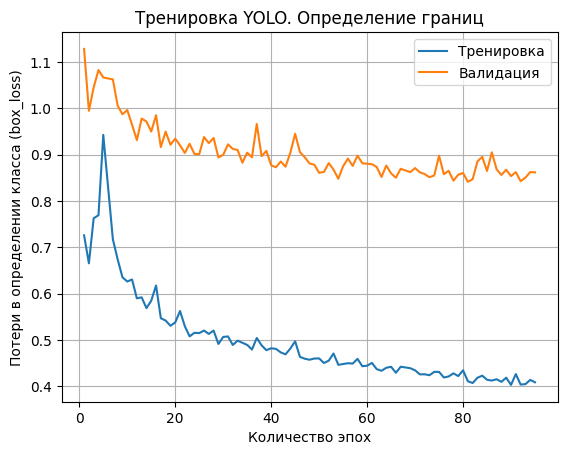

In [20]:
# Указываем путь к JSON-файлу
file_path = '/content/val_box_loss_chart_data.json'

# Открываем файл и загружаем данные JSON
with open(file_path, 'r') as file:
    data_val = json.load(file)

# Указываем путь к JSON-файлу
file_path = '/content/val_cls_loss_chart_data.json'

# Открываем файл и загружаем данные JSON
with open(file_path, 'r') as file:
    data_train = json.load(file)

# Извлечение значений x и y
x_val_box= data_val[0]['x']
y_val_box = data_val[0]['y']

x_train_box = data_train[0]['x']
y_train_box = data_train[0]['y']


# Создание фигуры и осей
fig, ax = plt.subplots()

# Построение кривых
ax.plot(x_train_box, y_train_box, label='Тренировка')
ax.plot(x_val_box, y_val_box, label='Валидация')


# Добавление легенды
ax.legend()

plt.xlabel('Количество эпох')
plt.ylabel('Потери в определении класса (box_loss)')
plt.title('Тренировка YOLO. Определение границ')
plt.grid(True)
# Отображение графика
plt.show()


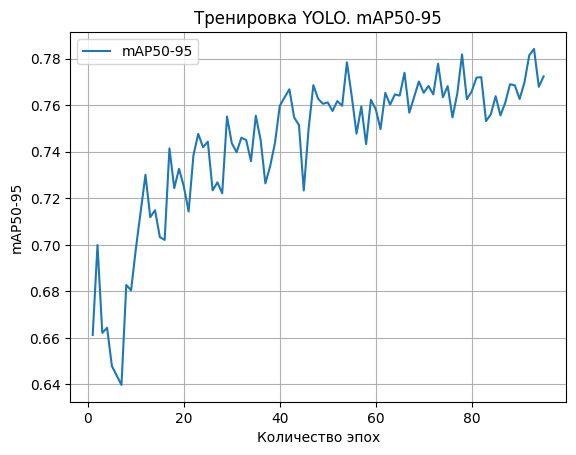

In [25]:
# Указываем путь к JSON-файлу
file_path = '/content/metrics_map50_95(b)_chart_data.json'

# Открываем файл и загружаем данные JSON
with open(file_path, 'r') as file:
    data = json.load(file)

x_metrics = data[0]['x']
y_metrics = data[0]['y']


# Создание фигуры и осей
fig, ax = plt.subplots()

# Построение кривых
ax.plot(x_metrics, y_metrics, label='mAP50-95')


# Добавление легенды
ax.legend()

plt.xlabel('Количество эпох')
plt.ylabel('mAP50-95')
plt.title('Тренировка YOLO. mAP50-95')
plt.grid(True)
# Отображение графика
plt.show()
